# Wstęp do Sztucznej Inteligencji - rok akademicki 2021/2022

Przed rozpoczęciem pracy z notatnikiem zmień jego nazwę zgodnie z wzorem: `NrAlbumu_Nazwisko_Imie_PoprzedniaNazwa`.

Przed wysłaniem notatnika upewnij się, że rozwiązałeś wszystkie zadania/ćwiczenia.

# Temat: Optymalizacja globalna: Prosty algorytm genetyczny - Zadania
Zapoznaj się z treścią niniejszego notatnika czytając i wykonując go komórka po komórce. Wykonaj napotkane zadania/ćwiczenia.

## Import bibliotek

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import math

## Zadanie 1  (obowiązkowe, 1pkt.)
W komórce poniżej wprowdź swój nr albumu a następnie ją wykonaj:

In [3]:
nr_albumu = 122323
nr_funkcji = (nr_albumu % 16) + 1
print('Twój nr funkcji celu to:', nr_funkcji if nr_funkcji != 6 else 7)

Twój nr funkcji celu to: 4


Zgodnie z wygenerowanym numerem, wybierz funkcję celu ze strony: https://www.sfu.ca/~ssurjano/optimization.html z działu "Many Local Minima".

Zaplementuj ją jako funkcję w Pythonie.

Dla wszystkich funkcji przyjmujemy `N=2` tzn. rozważamy ją jako funkcję dwóch zmiennych $f(x_1, x_2)$.

TWÓJ PROGRAM:

In [4]:
def obj_func(x):
    return -(1+math.cos(12*(x[0]**2+x[1]**2)**0.5))/(0.5*(x[0]**2+x[1]**2)+2)

## Zadanie 2  (obowiązkowe, 1pkt.)
Przygotuj wykres 3D funkcji zaimplementowanej w zadaniu nr 1.

TWÓJ PROGRAM:

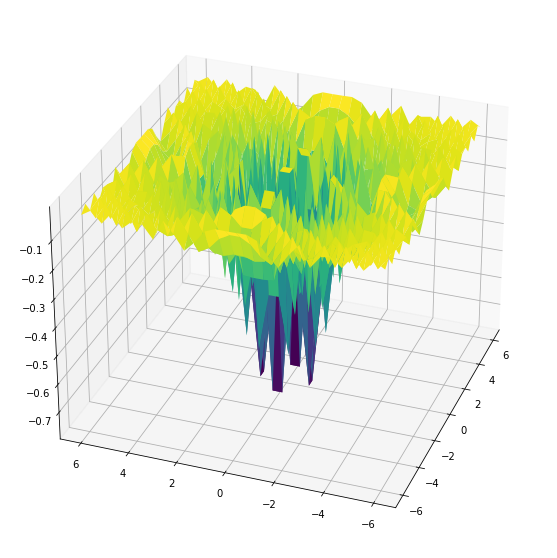

In [5]:
n = 30
sampled = np.linspace(-6, 6, n)
x, y = np.meshgrid(sampled, sampled)
z = np.zeros((len(sampled),len(sampled)))

for i in range(len(sampled)):
    for j in range(len(sampled)):
        z[i, j] = obj_func(np.array([x[i,j],y[i,j]]))

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(x, y, z, rstride=1, cstride=1, cmap='viridis', linewidth=0.4, antialiased=True)
ax.view_init(30, 200)
plt.show()

## Zadanie 3 (obowiązkowe, 2pkt.)
Korzystając z funkcji zaimplementowanych na poprzednich zajęciach, zaimplementuj główną pętlę klasycznego algorytmu genetyczengo.
![pag_schemat.png](http://torus.uck.pk.edu.pl/~amarsz/images/pag_schemat.png)

Implementacja powinna mieć postać funkcji, która przyjmuje parametry:

- `fun` - funkcja, której maksimum ma zostać znalezione
- `pop_size` - rozmiar populacji
- `pk` - prawdopodobieństwo krzyżowania
- `pm` - prawdopodobieństwo mutacji
- `generations` - liczba pokoleń 
- `dx` - dokładność kodowania

Funkcja powinna zwracać:
- `best_sol` - najlepsze znalezione rozwiązanie (nieważne, w której iteracji; UWAGA! niekoniecznie jest to najlepszy osobnik z ostatniej populacji)
- `best_generation` - numer pokolenia, z którego pochodzi najlepsze rozwiązanie
- `list_best` - lista z najlepszą oceną osobnika w każdym pokoleniu (najlepsza ocena znaleziona w danym pokoleniu lub wcześniej)
- `list_best_generation` - lista z najlepszymi ocenami w każdym pokoleniu (najlepsza ocena z danej populacji)
- `list_mean` - lista z wartościami średnimi ocen osobników z każdego pokolenia

TWÓJ PROGRAM:

In [6]:
import math as m
import random


def nbits(a, b, dx):
    N = m.ceil((b-a)/dx+1)
    B = N.bit_length();
    dx_new = (b-a)/(2**B -1)
    return B, dx_new

def gen_population(P, N, B):
    pop = np.ndarray(shape =(P,B*N))
    for i in range(0,P):
        for j in range(0, B*N):
            pop[i][j]=np.random.randint(0,2)
    return pop

def decode_individual(individual, N, B, a, dx):
    decode_solution = np.ndarray(shape=(N))
    arr = np.array_split(individual, N)
    result = [0 for i in range(0, N)]

    for i in range(0, N):
        exp = 0
        for j in reversed(arr[i]):
            result[i] += j * 2**exp
            exp += 1
    
    for i in range(0, N):
        decode_solution[i] = result[i] * dx + a

    return decode_solution

def evaluate_population(func, pop, N, B, a, dx):
    evaluated_pop = np.ndarray(len(pop))
    for i, indvidual in enumerate(pop): 
        evaluated_pop[i] = func(decode_individual(indvidual, N, B, a, dx))
    return evaluated_pop

def get_best(pop, evaluated_pop):
    best_value = np.amax(evaluated_pop)
    index = np.where(evaluated_pop == best_value)
    best_individual = pop[index][0]
    
    return best_individual, best_value

def roulette(pop, evaluated_pop):
    minimum = evaluated_pop.min()
    if(minimum < 0):
        absMinimum = abs(minimum)
        for i in range(evaluated_pop.size):
            evaluated_pop[i] += absMinimum
    evaluatedPopSum = 0
    for element in evaluated_pop:
        evaluatedPopSum += element
    
    probability = np.ndarray(shape=(evaluated_pop.size))
    
    for (index, element) in zip(range(0, evaluated_pop.size), evaluated_pop):
        probability[index] = element/evaluatedPopSum
    
    distributor = np.ndarray(shape=(probability.size))
    distributor[0] = probability[0]
    for i in range(1, distributor.size):
        distributor[i] = distributor[i-1] + probability[i]
    
    new_pop = np.ndarray(shape=(pop.size//pop[0].size,pop[0].size))
    for i in range(0, pop.size//pop[0].size,pop[0].size):
        randomNumber = np.random.rand()
        for j in range(0, evaluated_pop.size):
            if distributor[j] > randomNumber:
                new_pop[i] = pop[j]
                break
        
    return new_pop

def cross(pop, pk):
    numberOfIndividuals = pop.size//pop[0].size
    new_pop = np.ndarray(shape=(numberOfIndividuals,pop[0].size))
    for i in range(numberOfIndividuals):
        if(np.random.rand() < pk):
            randomInt = random.randint(1, pop[0].size-1)
            new_pop[i] = np.concatenate((pop[i][:randomInt], pop[(i+1)%numberOfIndividuals][randomInt:]),axis = None)
        else:
            new_pop[i] = pop[i]
    return new_pop

def mutate(pop, pm):
    numberOfIndividuals = pop.size//pop[0].size
    new_pop = np.ndarray(shape=(numberOfIndividuals,pop[0].size))
    for i in range(numberOfIndividuals):
        for j in range(pop[i].size):
            randomNumber = np.random.rand()
            if(randomNumber <= pm):
                if(pop[i][j] == 0):
                    new_pop[i][j] = 1
                else:
                    new_pop[i][j] = 0
            else:
                new_pop[i][j]=pop[i][j]
    return new_pop


In [7]:
import time

def evolveFirst(fun, pop_size, pk, pm, generations, dx):
    P = int(pop_size / 2)
    N = 2
    begin = -6
    end = 6
    
    #generuj początkową populację
    B, dx2 = nbits(begin, end, dx)
    pop = gen_population(P, N, B)
    
    #oceń osobniki w populacji
    score = evaluate_population(fun, pop, N, B, begin, dx2)

    #znajdź i zapamiętaj najlepsze rozwiązanie
    best_a, best_sol = get_best(pop, score)
    best_arg = decode_individual(best_a, N, B, begin, dx2)
    
    #uaktualnij listy statystyk
    list_best = [-best_sol]
    list_mean = [np.average(-score)]
    list_best_generation = [-best_sol]
    
    for i in range(generations):
        time.sleep(0.2)
        
        #selekcja
        pop = roulette(pop, score)
        
        #krzyżowanie
        pop = cross(pop, pk)
        
        #mutacja
        pop = mutate(pop, pm)

        #oceń osobniki w populacji
        score = evaluate_population(fun, pop, N, B, begin, dx2)
        
        #znajdź i zapamiętaj najlepsze rozwiązanie, jeśli jest lepsze niż dotychczasowe najlepsze
        val = np.max(score)
        
        #uaktualnij listy statystyk
        list_best_generation.append(-val)
        if val > best_sol:
            best_sol = val
            best_arg = decode_individual(pop[np.argmax(score)], N, B, begin, dx2)
            best_generation = i
        list_best.append(-best_sol)
        list_mean.append(np.average(-score))
        
    return best_sol, best_generation, list_best, list_best_generation, list_mean

In [ ]:
print(evolveFirst(obj_func, 60, 0.7, 0.01, 200, 1e-10))

## Zadanie 4 (obowiązkowe, 1pkt.)

Zaprezentuj działanie algorytmu z przykładowymi wartościami parametrów:

- `pop_size`: 60
- `pk`: 0.7
- `pm`: 0.01
- `generations`: 200
- `dx`: 1e-10

Na wykresach funkcji 3D przedstaw położenie osobników z pierwszej populacji, w połowie ewolucji oraz końcowej populacji. Zaznacz wyraźnie położenie najlepszeg rozwiązania.

Na wykresach 2D przedstaw przebieg wartości z list z zebranymi statystykami (listy `list_best`, `list_best_generation`, `list_mean`) w zależności od numeru pokolenia. 

TWÓJ PROGRAM:

In [95]:
import io
import time
import base64
import IPython

def evolveSecond(fun, pop_size, pk, pm, generations, dx):
    P = int(pop_size / 2)
    N = 2
    begin = -6
    end = 6
    
    #generuj początkową populację
    B, dx2 = nbits(begin, end, dx)
    pop = gen_population(P, N, B)
    
    #oceń osobniki w populacji
    score = evaluate_population(fun, pop, N, B, begin, dx2)

    #znajdź i zapamiętaj najlepsze rozwiązanie
    best_a, best_sol = get_best(pop, score)
    best_arg = decode_individual(best_a, N, B, begin, dx2)
    
    #uaktualnij listy statystyk
    list_best = [-best_sol]
    list_mean = [np.average(-score)]
    list_best_generation = [-best_sol]
    
    def fig2b64(f):
        data = io.BytesIO()
        f.savefig(data, format='png')
        data.seek(0)
        return base64.b64encode(data.read()).decode()
    
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    pop_d = []
    for os in pop:
        pop_d.append(decode_individual(os, N, B, begin, dx2))
    pop_d = np.array(pop_d)
    ax1.scatter(pop_d[:,0], pop_d[:,1], color='k',s=40)
    sampled = np.linspace(-6, 6, 20)
    x, y = np.meshgrid(sampled, sampled)
    z = np.zeros((len(sampled),len(sampled)))
    for ii in range(len(sampled)):
        for j in range(len(sampled)):
            z[ii, j] = -obj_func(np.array([x[ii,j], y[ii,j]]))
    CS = ax1.contour(x, y, z)
    ax1.clabel(CS, inline=1, fontsize=10)
    ax2 = fig.add_subplot(122)
    ax2.plot(list_best)
    ax2.plot(list_mean)
    ax2.plot(list_best_generation)
    ax1.set_xlim(-6, 6)
    ax1.set_ylim(-6, 6)

    data_str = fig2b64(fig)
    rys = IPython.display.display_html(f'<img class="myimage" src="data:image/png;base64,{data_str}"></img>', raw=True)
    
    for i in range(generations):
        time.sleep(0.2)
        
        #selekcja
        pop = roulette(pop, score)
        
        #krzyżowanie
        pop = cross(pop, pk)
        
        #mutacja
        pop = mutate(pop, pm)

        #oceń osobniki w populacji
        score = evaluate_population(fun, pop, N, B, begin, dx2)
        
        #znajdź i zapamiętaj najlepsze rozwiązanie, jeśli jest lepsze niż dotychczasowe najlepsze
        val = np.max(score)
        
        #uaktualnij listy statystyk
        list_best_generation.append(-val)
        if val > best_sol:
            best_sol = val
            best_arg = decode_individual(pop[np.argmax(score)], N, B, begin, dx2)
            best_generation = i
        list_best.append(-best_sol)
        list_mean.append(np.average(-score))
        
        pop_d = []
        for os in pop:
            pop_d.append(decode_individual(os, N, B, begin, dx2))
        pop_d = np.array(pop_d)
        ax1.clear()
        ax1.scatter(pop_d[:,0], pop_d[:,1], color='k',s=40)
        sampled = np.linspace(-6, 6, 20)
        x, y = np.meshgrid(sampled, sampled)
        z = np.zeros((len(sampled),len(sampled)))
        for ii in range(len(sampled)):
            for j in range(len(sampled)):
                z[ii, j] = -obj_func(np.array([x[ii,j], y[ii,j]]))
        CS = ax1.contour(x, y, z)
        ax1.clabel(CS, inline=1, fontsize=10)
        ax2.clear()
        ax2 = fig.add_subplot(122)
        ax2.plot(list_best)
        ax2.plot(list_mean)
        ax2.plot(list_best_generation)
        ax1.set_xlim(-6, 6)
        ax1.set_ylim(-6, 6)
        data_str = fig2b64(fig)
        IPython.display.display_javascript(f'''document.querySelector('.myimage').src = 'data:image/png;base64,{data_str}';''', raw=True)
    plt.close(1)


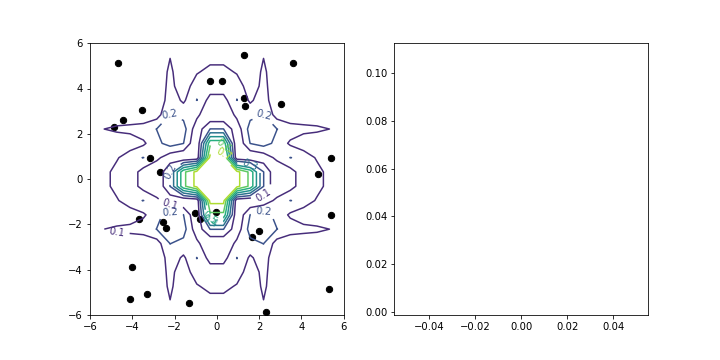

In [98]:
evolveSecond(obj_func, 60, 0.7, 0.01, 200, 1e-10)

## Zadanie 5 (obowiązkowe, 5pkt.)

Zbadaj wpływ parametrów klasycznego algorytmu genetycznego na jego zdolność znalezienia optymalnego rozwiązania. Dla ułatwienia analizy, zmieniając jeden parametr, zachowaj typowe wartości pozostałych.

1. Jak działa algorytm z typowymi ustawieniami parametrów (jak w zadaniu 4)? Podaj średnią wartość przystosowania znalezionego rozwiązania po wielokrotnym uruchomieniu AG.
2. Czy wydłużenie ewolucji przynosi poprawę czy też następuje "nasycenie"? Porównaj zarówno jak dobre rozwiązanie zostało znalezione jak również w której generacji.
    - `generations`: kilka różnych wartości z przedziału [100, 10000]
3. Czy mutacja jest potrzebna? 
    - `pm` = 0.0
4. Jak działa algorytm bez krzyżowania, z samą mutacją? 
    - `pk` = 0.0
5. Czy lepiej jest dłużej ewoluować mniejszą populację czy krócej większą, jeśli liczba ewaluacji funkcji jest taka sama (np. 2000)?
    - porównaj dwa ustawienia: `pop_size`=20, `generations`=100  vs. `pop_size`=100, `generations`=20.

UWAGA: Powyższe porównania powinny być wykonane na podstawie uśrednionych wyników co najmniej 10 uruchomień algorytmu z danymi parametrami. Podając wyniki podaj średnią z najlepszych znalezionych rozwiązań oraz odchylenie standardowe oraz numer pokolenia, w którym znaleziono rozwiązanie.

TWÓJ PROGRAM:

In [25]:
#przygotuj wartości parametrów AG
pop_size = 60
pk = 0.7
pm = 0.01
generations = 200
dx = 1e-10

exec_num = 2 # lub więcej

result1 = tuple()
result2 = tuple()
result3 = tuple()
result4 = tuple()
result51 = tuple()
result52 = tuple()

solution1 = list()
solution2 = list()
solution3 = list()
solution4 = list()
solution51 = list()
solution52 = list()

avg1 = 0
avg2 = 0
avg3 = 0
avg4 = 0
avg51 = 0
avg52 = 0

standardDeviation1 = 0
standardDeviation2 = 0
standardDeviation3 = 0
standardDeviation4 = 0
standardDeviation51 = 0
standardDeviation52 = 0

for i in range(exec_num):
    result1 = evolveFirst(obj_func, pop_size, pk, pm, generations, dx)
    solution1.append(result1[0])
    avg1 += result1[0]
    print("ZAD1: Pokolenie numer:",result1[1])
    
    result2 = evolveFirst(obj_func, pop_size, pk, pm, 700, dx)
    solution2.append(result2[0])
    avg2 += result2[0]
    print("ZAD2: Pokolenie numer:",result2[1])
    
    result3 = evolveFirst(obj_func, pop_size, pk, 0.0, generations, dx)
    solution3.append(result3[0])
    avg3 += result3[0]
    print("ZAD3: Pokolenie numer:",result3[1])
    
    result4 = evolveFirst(obj_func, pop_size, 0.0, pm, generations, dx)
    solution4.append(result4[0])
    avg4 += result4[0]
    print("ZAD4: Pokolenie numer:",result4[1])
    
    result51 = evolveFirst(obj_func, 20, pk, pm, 100, dx)
    solution51.append(result51[0])
    avg51 += result51[0]
    print("ZAD5.1: Pokolenie numer:",result51[1])
    
    result52 = evolveFirst(obj_func, 100, pk, pm, 20, dx)
    solution52.append(result52[0])
    avg52 += result52[0]
    print("ZAD5.2: Pokolenie numer:",result52[1])

#wylicz średnią i odchylenie standardowe
print("ZAD 1: Średnia: ", avg1 / exec_num)
print("ZAD 2: Średnia: ", avg2 / exec_num)
print("ZAD 3: Średnia: ", avg3 / exec_num)
print("ZAD 4: Średnia: ", avg4 / exec_num)
print("ZAD 5.1: Średnia: ", avg51 / exec_num)
print("ZAD 5.2: Średnia: ", avg52 / exec_num)

for i in range(exec_num):
    standardDeviation1 += (solution1[i] - (avg1 / exec_num))**2
    standardDeviation2 += (solution2[i] - (avg2 / exec_num))**2
    standardDeviation3 += (solution3[i] - (avg3 / exec_num))**2
    standardDeviation4 += (solution4[i] - (avg4 / exec_num))**2
    standardDeviation51 += (solution51[i] - (avg51 / exec_num))**2
    standardDeviation52 += (solution52[i] - (avg52 / exec_num))**2

print("ZAD 1: Odchylenie: ", np.sqrt(standardDeviation1 / exec_num))
print("ZAD 2: Odchylenie: ", np.sqrt(standardDeviation2 / exec_num))
print("ZAD 3: Odchylenie: ", np.sqrt(standardDeviation3 / exec_num))
print("ZAD 4: Odchylenie: ", np.sqrt(standardDeviation4 / exec_num))
print("ZAD 5.1: Odchylenie: ", np.sqrt(standardDeviation51 / exec_num))
print("ZAD 5.2: Odchylenie: ", np.sqrt(standardDeviation52 / exec_num))

ZAD1: Pokolenie numer: 180
ZAD2: Pokolenie numer: 521


C:\Users\MrChi\AppData\Local\Temp/ipykernel_11596/1732210517.py:60: RuntimeWarning: invalid value encountered in double_scalars
  probability[index] = element/evaluatedPopSum


ZAD3: Pokolenie numer: 1
ZAD4: Pokolenie numer: 136


UnboundLocalError: local variable 'best_generation' referenced before assignment

&copy; Katedra Informatyki, Politechnika Krakowska